In [8]:
import pandas as pd
import seaborn as sns

df = pd.read_csv('../po2_data.csv')
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5875 entries, 0 to 5874
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   subject#        5875 non-null   int64  
 1   age             5875 non-null   int64  
 2   sex             5875 non-null   object 
 3   test_time       5875 non-null   float64
 4   motor_updrs     5875 non-null   float64
 5   total_updrs     5875 non-null   float64
 6   jitter(%)       5875 non-null   float64
 7   jitter(abs)     5875 non-null   float64
 8   jitter(rap)     5875 non-null   float64
 9   jitter(ppq5)    5875 non-null   float64
 10  jitter(ddp)     5875 non-null   float64
 11  shimmer(%)      5875 non-null   float64
 12  shimmer(abs)    5875 non-null   float64
 13  shimmer(apq3)   5875 non-null   float64
 14  shimmer(apq5)   5875 non-null   float64
 15  shimmer(apq11)  5875 non-null   float64
 16  shimmer(dda)    5875 non-null   float64
 17  nhr             5875 non-null   f

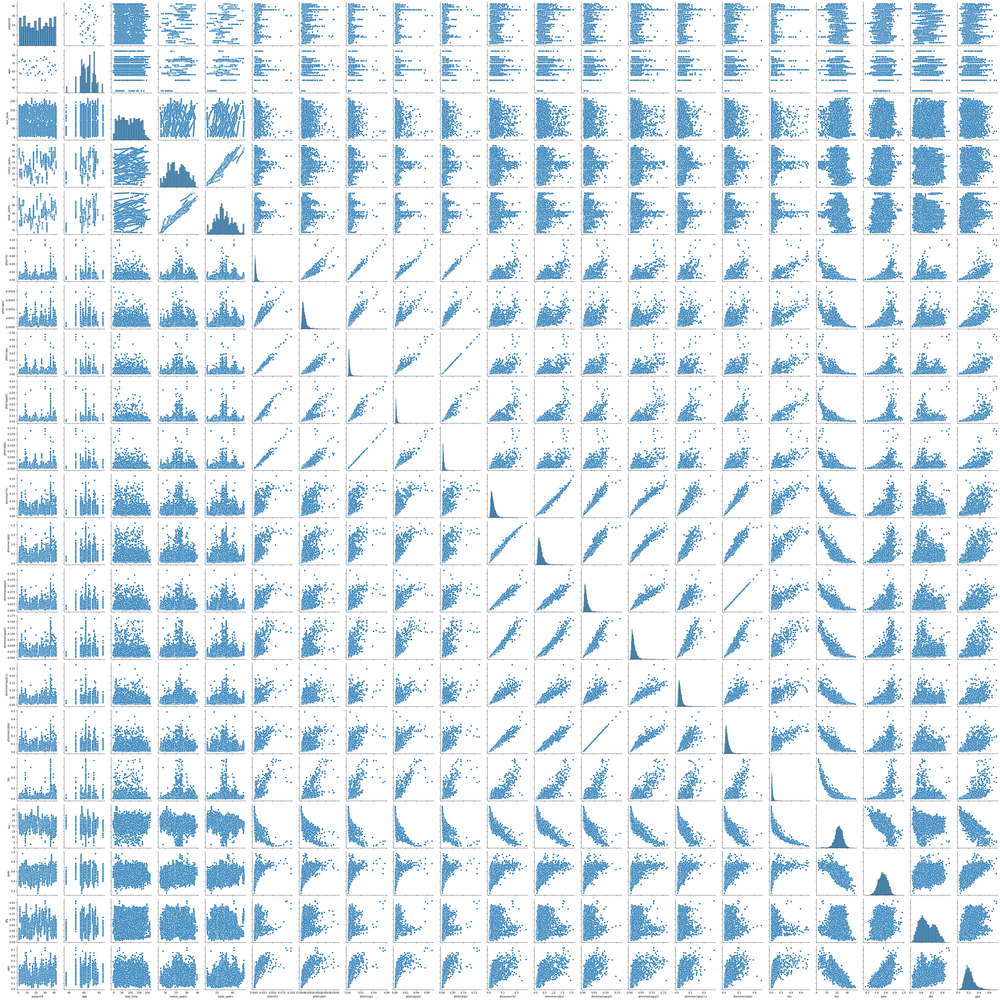

In [9]:
sns.pairplot(df)

With test size 0.3  [[1.24688803]]
[2.4111199]
With test size 0.2 [[1.24601638]]
[2.48134784]


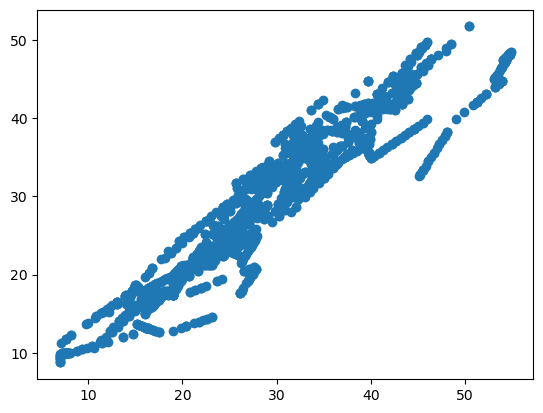

In [10]:
from sklearn.model_selection import train_test_split
import numpy as np

x = df['motor_updrs'].values.reshape(-1, 1)
y = df['total_updrs'].values.reshape(-1, 1)

# with test_size 0.3
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
# print('X train', x_train)
# print('X test', x_test)
# print('Y train', y_train)
# print('Y test', y_test)
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(x_train, y_train)
print("With test size 0.3 ", model.coef_)
print(model.intercept_)
pd.DataFrame(model.coef_, columns = ['Coeff'])

# with test size = 0.2
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3)
model = LinearRegression()
model.fit(x_train, y_train)
print("With test size 0.2", model.coef_)
print(model.intercept_)
newData = pd.DataFrame(model.coef_, columns = ['Coeff'])
newData
# prediction
import matplotlib.pyplot as plt
predictions = model.predict(x_test)
plt.scatter(y_test, predictions)

(array([ 43., 221., 324., 533., 374.,  94.,  58.,  69.,  30.,  17.]),
 array([-7.35175341, -5.3671201 , -3.38248679, -1.39785348,  0.58677983,
         2.57141314,  4.55604646,  6.54067977,  8.52531308, 10.50994639,
        12.4945797 ]),
 <BarContainer object of 10 artists>)

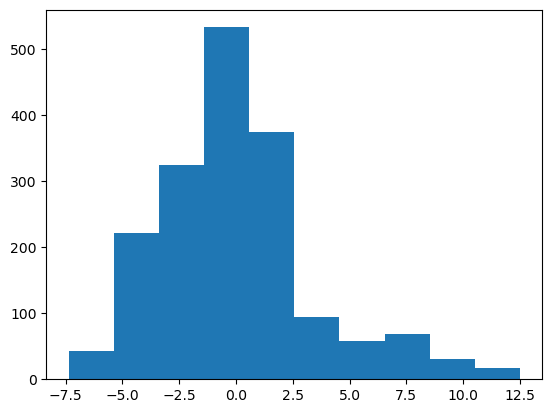

In [11]:
plt.hist(y_test - predictions)

In [12]:
from sklearn import metrics
metrics.mean_absolute_error(y_test, predictions)
metrics.mean_squared_error(y_test, predictions)
np.sqrt(metrics.mean_squared_error(y_test, predictions))

3.4427038797152645

In [13]:
model.score(x_train, y_train)
model.score(x_test, y_test)

0.8930620454989889

Text(0, 0.5, 'y')

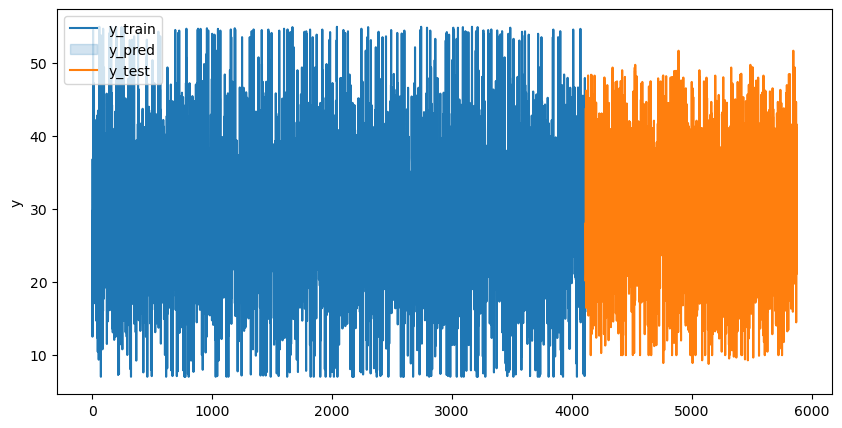

In [14]:
pred = pd.DataFrame(predictions, columns = ['y_pred'])
train = pd.DataFrame(y_train,columns = ['y_train'])
final = pd.concat([train,pred],ignore_index=True,sort=False)
plt.figure(figsize=(10,5))
sns.lineplot(x=final.index, y=final['y_train'])
sns.lineplot(x=final.index, y=final['y_pred'])
plt.legend(['y_train','y_pred','y_test'],
            loc='upper left')
plt.ylabel('y')